To validate my approach beyond baseline reproduction, I built a custom VGG19 style transfer pipeline from scratch, implementing the training loop, loss functions, and optimization schedule myself. Although the VGG feature extractor used pretrained ImageNet weights (a standard practice for stability), the overall pipeline design and evaluation were independently developed. I also tested the model on a dataset to produce a portfolio of stylized images, which informed later refinements and contributed directly to the final integrated prototype.

In [1]:
# Install gdown to download the dataset folder (COCO for content + WikiArt for style images) from Google Drive
!pip install -q gdown

# Shared Google Drive folder link
url = "https://drive.google.com/drive/folders/1xJy4FXcBIHKnjO5t_m8PJsevBJQ2_6G-?usp=sharing"

# Download the shared Google Drive folder into a local directory named "dataset"
!gdown --folder "$url" -O dataset

# Verify the folder contents after download
import os
for root, dirs, files in os.walk("dataset"):
    # Count folder depth based on subfolders inside folder
    level = root.replace("dataset", "").count(os.sep)
    # Create indent spaces depending on folder depth
    indent = " " * 2 * level
    # Print the current folder name
    print(f"{indent}{os.path.basename(root)}/")
    # Create indentation for files inside the folder
    subindent = " " * 2 * (level + 1)
    # Loop through each file inside the current folder and print with indentation
    for f in files:
        print(f"{subindent}{f}")


Retrieving folder contents
Retrieving folder 1_fp1L0SICq3dK1qinJ2xihgSQvCDO3dc content
Processing file 1ik5y2VdDHGX6IKkvRPMtWIRwacBvv6vY conetntimage4.jpg
Processing file 18QeAh7QJsBv9ESu5r8XNTfyJZNr-s_24 contentimage1.jpg
Processing file 1dH_N1xU1Lj1V_OdPzz2i_qXj5-XecWjI contentimage2.jpg
Processing file 1bBTdO2kMgEjypARMcAqTaFauatFqlceA contentimage3.jpg
Processing file 1LwOu6xSWZpq3OGALPu9gY8F1BR7TuUsr contentimage5.jpg
Processing file 1DdVNQlb2REN4kf4Eqr_AKwRhChl07_qT contentimage6.jpg
Processing file 1Sig0Npi1fm9KQpGY9kvneuHoYZtGfP8q contentimage7.jpg
Processing file 1-wGRnW49jTJLfRV0p3tmTBDxs_6l0rDl contentimage8.jpg
Processing file 1ZULwJr4pRhcHYWKeMig9MkeT-dBXYIef contentimage9.jpg
Processing file 1r9o2G4J3cpOpYHcSBMjVQwMygJUnVMoB contentimage10.jpg
Processing file 1R4X3zMs0jkE7xtj1DRBvHs1Cv9nxTJpm name.jpg
Retrieving folder 1WYCvD-aKiBKCILx-8nFoSwKaYCJe2lCC style
Processing file 1txqDbVLgbvZukdn_fjImMlO3ewemO-T3 wikiartstyle.jpg
Processing file 1tup8CiYq23QanPXEU7aY5WF8tLGrsFB

In [2]:
#Confirm and check contents inside the downloaded folder
import os

# Define path to the dataset folder
folder_path = "/content/dataset"


# Walk through the folder and its subfolders (verify contents once again)
for root, dirs, files in os.walk(folder_path):
    # indentation based on depth of the folder
    level = root.replace(folder_path, "").count(os.sep)
    # Create indent spaces depending on folder depth
    indent = " " * 2 * level
    # Print the current folder name
    print(f"{indent}{os.path.basename(root)}/")
     # Create indentation for files inside the folder
    subindent = " " * 2 * (level + 1)
     # Loop through each file inside the current folder and print with indentation
    for f in files:
        print(f"{subindent}{f}")


dataset/
  content/
    contentimage6.jpg
    contentimage8.jpg
    name.jpg
    contentimage2.jpg
    contentimage9.jpg
    contentimage10.jpg
    contentimage7.jpg
    contentimage3.jpg
    contentimage1.jpg
    conetntimage4.jpg
    contentimage5.jpg
  style/
    wikiartstyle7.jpg
    wikiartstyle10.jpg
    wikiartstyle6.jpg
    wikiartstyle3.jpg
    wikiartstyle4.jpg
    wikiartstyle8.jpg
    wikiartstyle2.jpg
    wikiartstyle5.jpg
    wikiartstyle9.jpg
    wikiartstyle.jpg



 Using content image: contentimage3.jpg
 Using style image:   wikiartstyle4.jpg
80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

 Epoch 1/1
   Step 50/50
 Stylization complete. Showing result:


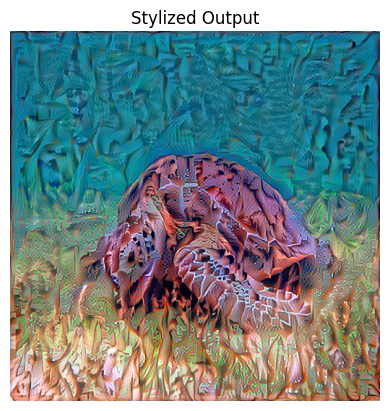

In [3]:
# Import TensorFlow for deep learning operations
import tensorflow as tf
import numpy as np
# Import Matplotlib for image visualisation
import matplotlib.pyplot as plt
import os
import random

# Import VGG19 pretrained model
from tensorflow.keras.applications import vgg19
# Import Model API from Keras
from tensorflow.keras.models import Model


# Define function to load an image
def load_img(path_to_img):
    img = tf.io.read_file(path_to_img)
    # Convert to RGB to ensure three channels
    img = tf.image.decode_image(img, channels=3)
    # Normalise pixel values to [0,1]
    img = tf.image.convert_image_dtype(img, tf.float32)
    # Resize image to fixed resolution of (512x512)
    img = tf.image.resize(img, (512, 512))
    # Add batch dimension (1, height, width, channels)
    img = img[tf.newaxis, :]
    return img


# Define function to display an image
def imshow(image, title=None):
    # Remove batch dimension if it exists to be accepted for matplotlib later on
    if len(image.shape) > 3:
        image = tf.squeeze(image, axis=0)
    # Show image using matplotlib
    plt.imshow(image)
    if title:
        plt.title(title)
    # Hide axis to show clearer outputs
    plt.axis('off')
    plt.show()


# Define content layers to extract features from
content_layers = ['block5_conv2']

# Define style layers to extract features from
style_layers = [
    'block1_conv1', 'block2_conv1', 'block3_conv1',
    'block4_conv1', 'block5_conv1'
]

# Count number of content layers
num_content_layers = len(content_layers)

# Count number of style layers
num_style_layers = len(style_layers)


# Function to build VGG19 model returning specific layer outputs
def vgg_layers(layer_names):
    # Load pretrained VGG19 without top layers
    vgg = vgg19.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False

    # Get outputs of required layers
    outputs = [vgg.get_layer(name).output for name in layer_names]

    # Return new model with selected outputs
    return Model([vgg.input], outputs)


# Function to compute Gram matrix
def gram_matrix(input_tensor):
    # Multiply feature maps with themselves across channels
    result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
    # Get input shape
    input_shape = tf.shape(input_tensor)

    # Compute number of spatial locations
    num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
    # Normalize Gram matrix
    return result / num_locations


# Define model to extract style and content features
class StyleContentModel(tf.keras.models.Model):
    def __init__(self, style_layers, content_layers):
        # Initialize base class
        super().__init__()
        # Build VGG with both style and content layers
        self.vgg = vgg_layers(style_layers + content_layers)
        # Store style layer names
        self.style_layers = style_layers
        # Store content layer names
        self.content_layers = content_layers
        # Store number of style layers
        self.num_style_layers = len(style_layers)
        self.vgg.trainable = False

    def call(self, inputs):
        inputs = inputs * 255.0
        # Preprocess image for VGG
        preprocessed_input = vgg19.preprocess_input(inputs)
        outputs = self.vgg(preprocessed_input)

        # Split style and content outputs
        style_outputs, content_outputs = (outputs[:self.num_style_layers],
                                          outputs[self.num_style_layers:])
        # Convert style outputs to Gram matrices
        style_outputs = [gram_matrix(s) for s in style_outputs]
        # Create dictionary for content outputs
        content_dict = {c: v for c, v in zip(self.content_layers, content_outputs)}
        # Create dictionary for style outputs
        style_dict = {s: v for s, v in zip(self.style_layers, style_outputs)}
        # Return style and content dictionaries
        return {'content': content_dict, 'style': style_dict}


# Path to content images
content_dir = '/content/dataset/content'

# Path to style images
style_dir   = '/content/dataset/style'

# Collect all content image file paths
content_files = [os.path.join(content_dir, f) for f in os.listdir(content_dir) if f.lower().endswith(('jpg', 'png'))]

# Collect all style image file paths
style_files = [os.path.join(style_dir, f) for f in os.listdir(style_dir) if f.lower().endswith(('jpg', 'png'))]

# Pick random content and style image , just to test of the model works on the dataset
content_path = random.choice(content_files)
style_path = random.choice(style_files)

# Print chosen content image name
print(f"\n Using content image: {os.path.basename(content_path)}")
print(f" Using style image:   {os.path.basename(style_path)}")

# Load content and style image tensor
content_image = load_img(content_path)
style_image = load_img(style_path)


# Build extractor model
extractor = StyleContentModel(style_layers, content_layers)
# Extract style targets from style image
targets = extractor(style_image)


# Initialise weight for style loss
style_weight = 1e-2
# Initialise weight for content loss
content_weight = 1e4


# Define function for style + content loss
def style_content_loss(outputs):
    # Extract current style outputs
    style_outputs = outputs['style']

    # Extract current content outputs
    content_outputs = outputs['content']

    # Compute style loss
    style_loss = tf.add_n([
        tf.reduce_mean((style_outputs[name] - targets['style'][name])**2)
        for name in style_outputs
    ])
    style_loss *= style_weight / num_style_layers

    # Compute content loss
    content_loss = tf.add_n([
        tf.reduce_mean((content_outputs[name] - targets['content'][name])**2)
        for name in content_outputs
    ])
    content_loss *= content_weight / num_content_layers

    # Return total loss
    return style_loss + content_loss


# Define one training step
@tf.function()
def train_step(image):
    # Record operations for gradient calculation
    with tf.GradientTape() as tape:
        # Extract features from image
        outputs = extractor(image)

        # Compute style and content loss
        loss = style_content_loss(outputs)

    # Compute gradients of loss mapping to image
    grad = tape.gradient(loss, image)

    # Apply gradients to update image
    opt.apply_gradients([(grad, image)])

    # Clip updated image back to [0,1]
    image.assign(tf.clip_by_value(image, 0.0, 1.0))


# Create trainable variable from content image
image = tf.Variable(content_image)

# Define Adam optimizer
opt = tf.optimizers.Adam(learning_rate=0.02)

# Number of epochs
epochs = 1
# Define number of steps per epoch
steps_per_epoch = 50
# Initialize step counter
step = 0

# Iterate over epochs
for n in range(epochs):
    print(f"\n Epoch {n+1}/{epochs}")

    # Loop over steps
    for m in range(steps_per_epoch):
        # Increment step counter fo every iteration
        step += 1
        train_step(image)
        print(f"   Step {m+1}/{steps_per_epoch}", end='\r')

print("\n Stylization complete. Showing result:")
# Display final stylized image
imshow(image, title="Stylized Output")



 Generating Pair 1: contentimage7.jpg + wikiartstyle6.jpg


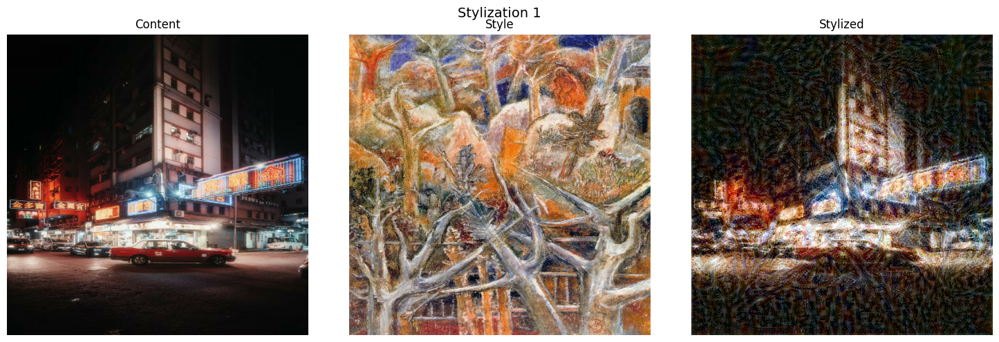


 Generating Pair 2: contentimage8.jpg + wikiartstyle5.jpg


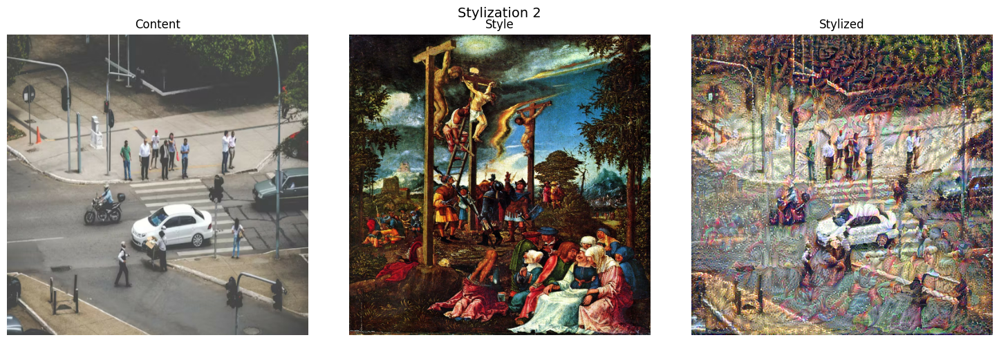


 Generating Pair 3: contentimage7.jpg + wikiartstyle.jpg


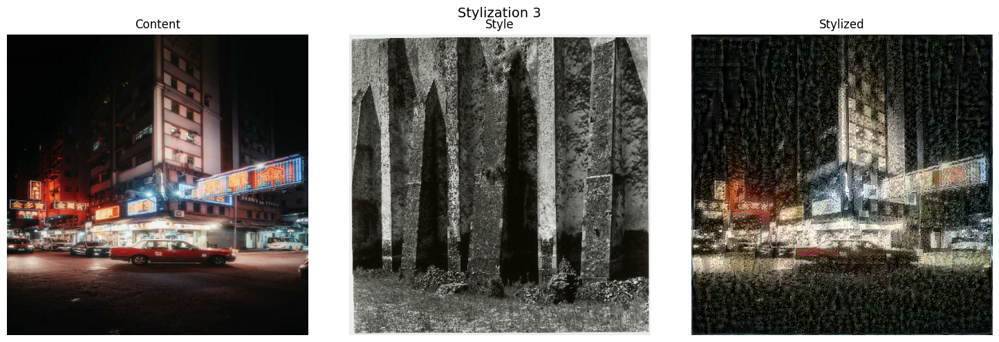


 Generating Pair 4: contentimage5.jpg + wikiartstyle10.jpg


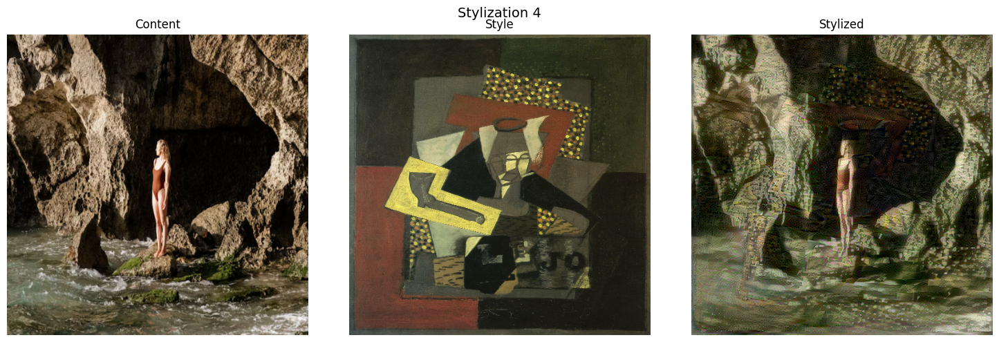


 Generating Pair 5: contentimage8.jpg + wikiartstyle9.jpg


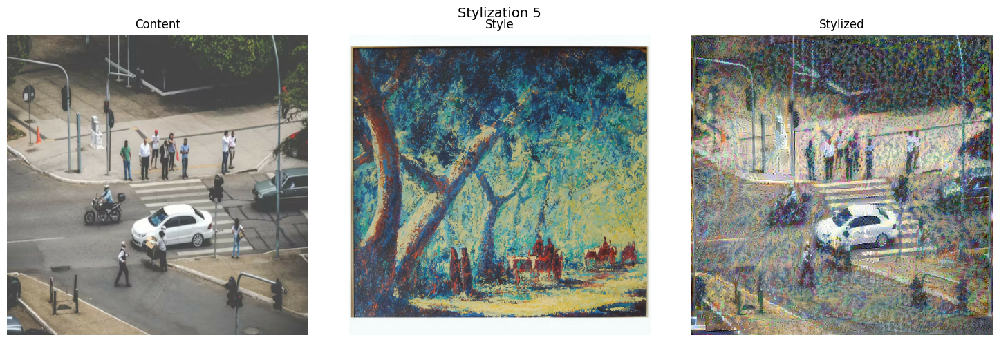


 Generating Pair 6: contentimage10.jpg + wikiartstyle3.jpg


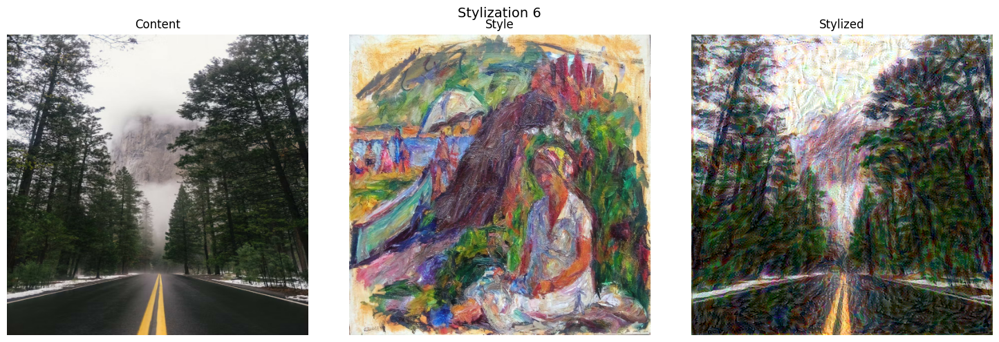


 Generating Pair 7: conetntimage4.jpg + wikiartstyle4.jpg


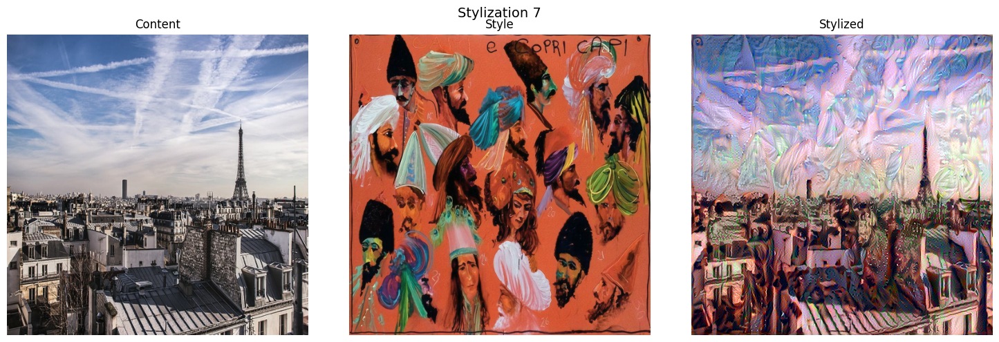


 Generating Pair 8: contentimage2.jpg + wikiartstyle7.jpg


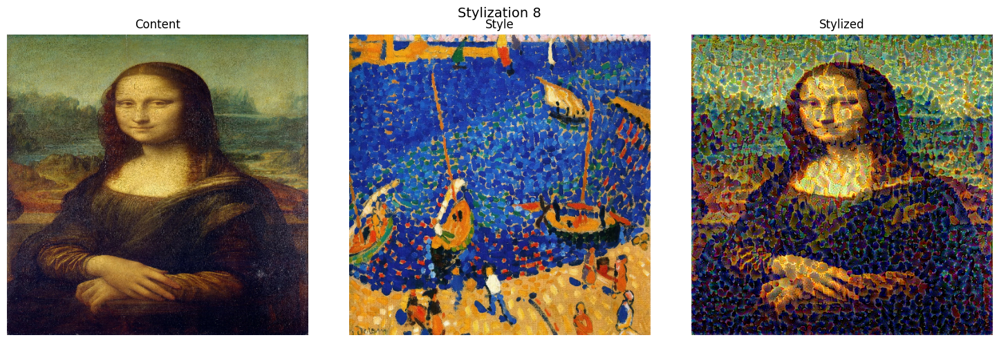


 Generating Pair 9: contentimage1.jpg + wikiartstyle4.jpg


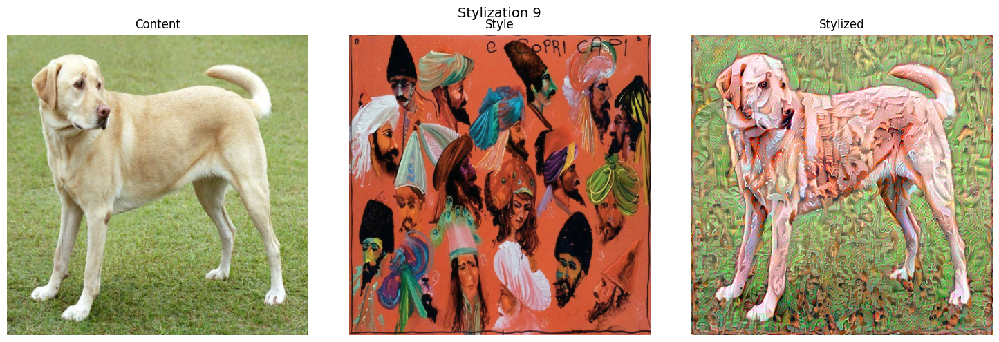


 Generating Pair 10: contentimage7.jpg + wikiartstyle9.jpg


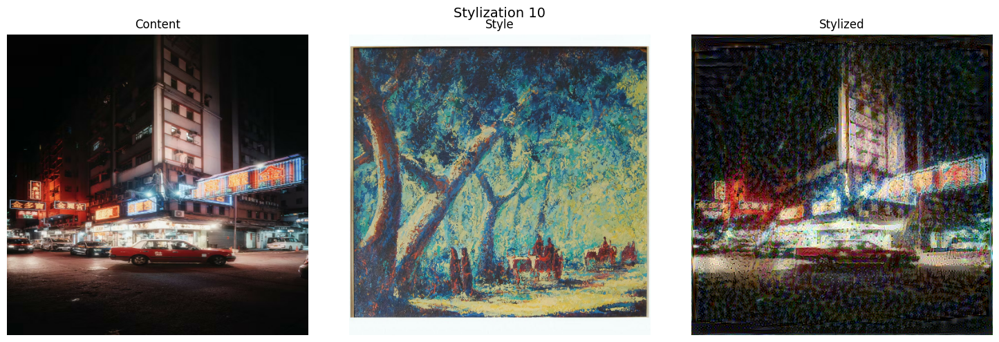

In [4]:

# Load image, preprocess and add batch dimension
def load_img(path_to_img):
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)
    img = tf.image.resize(img, (512, 512))
    img = img[tf.newaxis, :]
    return img


# Show side-by-side portfolio of content, style, and stylized output
def show_portfolio(content, style, output, title=None):
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # Loop through each image (content, style, output) and plot
    for ax, img, label in zip(axes, [content, style, output], ['Content', 'Style', 'Stylized']):
        if len(img.shape) == 4:  # Remove batch dim if present
            img = tf.squeeze(img, axis=0)
        ax.imshow(img)
        ax.set_title(label)
        ax.axis('off')

    # Add title if provided
    if title:
        fig.suptitle(title, fontsize=14)

    plt.tight_layout()
    plt.show()


# Define VGG19 layers for content and style extraction
content_layers = ['block5_conv2']
style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']

# Count number of layers
num_content_layers = len(content_layers)
num_style_layers = len(style_layers)


# Build VGG19 that outputs activations for selected layers
def vgg_layers(layer_names):
    vgg = vgg19.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False
    outputs = [vgg.get_layer(name).output for name in layer_names]
    return Model([vgg.input], outputs)


# Compute Gram matrix to capture style features
def gram_matrix(input_tensor):
    result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
    input_shape = tf.shape(input_tensor)
    num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
    return result / num_locations


# Custom model to extract style + content features
class StyleContentModel(tf.keras.models.Model):
    def __init__(self, style_layers, content_layers):
        super().__init__()
        self.vgg = vgg_layers(style_layers + content_layers)
        self.style_layers = style_layers
        self.content_layers = content_layers
        self.num_style_layers = len(style_layers)
        self.vgg.trainable = False

    def call(self, inputs):
        # Preprocess input for VGG
        inputs = inputs * 255.0
        preprocessed_input = vgg19.preprocess_input(inputs)

        # Get feature maps
        outputs = self.vgg(preprocessed_input)

        # Split into style and content
        style_outputs, content_outputs = (outputs[:self.num_style_layers],
                                          outputs[self.num_style_layers:])

        # Convert style outputs to Gram matrices
        style_outputs = [gram_matrix(style_output) for style_output in style_outputs]

        # Store as dictionaries
        content_dict = {content_name: value for content_name, value in zip(self.content_layers, content_outputs)}
        style_dict = {style_name: value for style_name, value in zip(self.style_layers, style_outputs)}

        return {'content': content_dict, 'style': style_dict}


# Dataset paths for content and style images
content_dir = '/content/dataset/content'
style_dir   = '/content/dataset/style'

# Collect content and style image file paths
content_files = [os.path.join(content_dir, f) for f in os.listdir(content_dir) if f.lower().endswith(('jpg', 'png'))]
style_files = [os.path.join(style_dir, f) for f in os.listdir(style_dir) if f.lower().endswith(('jpg', 'png'))]


# Define weights for style and content loss
style_weight = 1e-2
content_weight = 1e4


# Compute combined style + content loss
def style_content_loss(outputs, targets):
    style_outputs = outputs['style']
    content_outputs = outputs['content']

    # Style loss (MSE between Gram matrices)
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name] - targets['style'][name])**2)
                           for name in style_outputs])
    style_loss *= style_weight / num_style_layers

    # Content loss (MSE(mean squared error) between feature maps)
    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name] - targets['content'][name])**2)
                             for name in content_outputs])
    content_loss *= content_weight / num_content_layers

    return style_loss + content_loss


# Perform one training step
def train_step(image, extractor, targets, optimizer):
    # Record operations for gradient computation
    with tf.GradientTape() as tape:
        outputs = extractor(image)
        loss = style_content_loss(outputs, targets)

    # Compute gradients w.r.t. image
    grad = tape.gradient(loss, image)

    # Update image with optimizer
    optimizer.apply_gradients([(grad, image)])

    # Keep pixel values in range [0,1]
    image.assign(tf.clip_by_value(image, 0.0, 1.0))


# Run multiple random stylizations
num_samples = 10        # number of random pairs
steps_per_image = 50    # optimization steps per pair

# Loop through random samples
for i in range(num_samples):
    # Pick random content + style pair
    content_path = random.choice(content_files)
    style_path = random.choice(style_files)

    # Print selected pair
    print(f"\n Generating Pair {i+1}: {os.path.basename(content_path)} + {os.path.basename(style_path)}")

    # Load images
    content_image = load_img(content_path)
    style_image = load_img(style_path)

    # Build extractor and set targets
    extractor = StyleContentModel(style_layers, content_layers)
    targets = extractor(style_image)

    # Initialize trainable image and optimizer
    image = tf.Variable(content_image)
    optimizer = tf.optimizers.Adam(learning_rate=0.02)

    # Run optimization loop
    for step in range(steps_per_image):
        train_step(image, extractor, targets, optimizer)

    # Show portfolio of results
    show_portfolio(content_image, style_image, image, title=f"Stylization {i+1}")


In [6]:
# Import Gradio for building the web UI
import gradio as gr
# Import pretrained VGG19 from Keras
from tensorflow.keras.applications import vgg19
# Import Keras Model class
from tensorflow.keras.models import Model

# Import PIL for image handling and filters
from PIL import Image, ImageFilter

# Import OpenCV for color space conversions
import cv2


# Define the VGG19 layer to use for content extraction
content_layers = ['block5_conv2']

# Define the VGG19 layers to use for style extraction
style_layers   = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']

# Count number of content layers
num_content_layers = len(content_layers)

# Count number of style layers
num_style_layers   = len(style_layers)


# Build a VGG19 model that outputs activations from selected layers
def vgg_layers(layer_names):
    # Load pretrained VGG19 without the fully connected top
    vgg = vgg19.VGG19(include_top=False, weights='imagenet')
    # Freeze the model (no training)
    vgg.trainable = False
    # Collect outputs of the chosen layers
    outputs = [vgg.get_layer(name).output for name in layer_names]
    # Return a model mapping input → outputs
    return Model([vgg.input], outputs)


# Compute the Gram matrix, which represents style
def gram_matrix(input_tensor):
    # Compute channel correlations
    result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
    # Get input shape
    input_shape = tf.shape(input_tensor)
    # Number of locations = height × width
    num_locations = tf.cast(input_shape[1] * input_shape[2], tf.float32)
    # Normalize by number of locations
    return result / num_locations


# Define a custom model to return both style and content features
class StyleContentModel(tf.keras.models.Model):
    def __init__(self, style_layers, content_layers):
        # Inherit from keras.Model
        super().__init__()
        # Build VGG with style + content layers
        self.vgg = vgg_layers(style_layers + content_layers)
        # Store layer names
        self.style_layers = style_layers
        self.content_layers = content_layers
        self.num_style_layers = len(style_layers)
        # Freeze VGG weights
        self.vgg.trainable = False

    def call(self, inputs):
        # Scale inputs to match VGG expectations
        inputs = inputs * 255.0
        # Preprocess (mean subtraction, scaling)
        preprocessed_input = vgg19.preprocess_input(inputs)
        # Get outputs from VGG
        outputs = self.vgg(preprocessed_input)
        # Split into style outputs and content outputs
        style_outputs, content_outputs = (outputs[:self.num_style_layers],
                                          outputs[self.num_style_layers:])
        # Convert style outputs to Gram matrices
        style_outputs = [gram_matrix(s) for s in style_outputs]
        # Pack content outputs into dict
        content_dict = {name: val for name, val in zip(self.content_layers, content_outputs)}
        # Pack style outputs into dict
        style_dict   = {name: val for name, val in zip(self.style_layers,   style_outputs)}
        # Return both
        return {'content': content_dict, 'style': style_dict}


# Preprocess a PIL image into a [0,1] tensor of shape (1, 512, 512, 3)
def preprocess_img(pil_img):
    # Convert to numpy float array
    img = np.array(pil_img).astype(np.float32) / 255.0
    # Resize to 512×512
    img = tf.image.resize(img, (512, 512))
    # Add batch dimension
    return img[tf.newaxis, :]


# Blend multiple style images with their weights
def blend_style_targets(style_images, extractor, blend_weights):
    blended = None
    # Loop through each style image
    for i, img in enumerate(style_images):
        # Extract style features
        target = extractor(preprocess_img(img))['style']
        # First image → initialize dict
        if blended is None:
            blended = {key: val * blend_weights[i] for key, val in target.items()}
        else:
            # Add weighted style features
            for key in blended:
                blended[key] += target[key] * blend_weights[i]
    return blended


# Compute total style + content loss
def style_content_loss(outputs, targets, alpha, beta):
    # Extract predicted outputs
    style_outputs   = outputs['style']
    content_outputs = outputs['content']

    # Compute style loss
    style_loss = tf.add_n([
        tf.reduce_mean((style_outputs[name] - targets['style'][name])**2)
        for name in style_outputs
    ])

    # Compute content loss
    content_loss = tf.add_n([
        tf.reduce_mean((content_outputs[name] - targets['content'][name])**2)
        for name in content_outputs
    ])

    # Scale by α and β
    style_loss   *= beta  / num_style_layers
    content_loss *= alpha / num_content_layers

    # Return total loss
    return content_loss + style_loss


# Run the optimization loop to perform style transfer
def run_style_transfer(content_image, style_images, blend_weights, alpha, beta):
    # Preprocess the content image
    content_image = preprocess_img(content_image)
    # Build feature extractor
    extractor = StyleContentModel(style_layers, content_layers)
    # Build targets
    targets = {
        'style':   blend_style_targets(style_images, extractor, blend_weights),
        'content': extractor(content_image)['content']
    }

    # Initialize trainable image variable
    image = tf.Variable(content_image)
    # Define Adam optimizer
    optimizer = tf.optimizers.Adam(learning_rate=0.02)

    # Optimization loop
    for step in range(50):
        # Record operations for gradients
        with tf.GradientTape() as tape:
            outputs = extractor(image)
            loss = style_content_loss(outputs, targets, alpha, beta)
        # Compute gradients
        grad = tape.gradient(loss, image)
        # Apply update
        optimizer.apply_gradients([(grad, image)])
        # Clip values to [0,1]
        image.assign(tf.clip_by_value(image, 0.0, 1.0))

    # Remove batch dimension and return as numpy
    return tf.squeeze(image).numpy()


# Ensure numpy array is float32 in [0,1]
def to_float01(np_img):
    if np_img.dtype == np.uint8:
        arr = np_img.astype(np.float32) / 255.0
    else:
        arr = np_img.astype(np.float32)
    return np.clip(arr, 0.0, 1.0)


# Create binary mask for near-black pixels in content
def make_black_mask_from_np(content_np_resized, threshold=0.05):
    mask = np.all(content_np_resized < threshold, axis=-1).astype(np.float32)
    return mask[..., None]


# Preserve content colours, apply style only to luminance channel
def apply_colour_preservation(stylized_f01, content_resized_f01):
    # Convert to uint8 for OpenCV
    stylized_u8 = (np.clip(stylized_f01, 0, 1) * 255).astype(np.uint8)
    content_u8  = (np.clip(content_resized_f01, 0, 1) * 255).astype(np.uint8)

    # Convert RGB to YUV
    stylized_yuv = cv2.cvtColor(stylized_u8, cv2.COLOR_RGB2YUV)
    content_yuv  = cv2.cvtColor(content_u8,  cv2.COLOR_RGB2YUV)

    # Replace Y channel (luminance) with stylized version
    combined_yuv = content_yuv.copy()
    combined_yuv[..., 0] = stylized_yuv[..., 0]

    # Convert back to RGB
    final_rgb = cv2.cvtColor(combined_yuv, cv2.COLOR_YUV2RGB)
    return final_rgb.astype(np.float32) / 255.0


# Apply sharpness enhancement
def apply_sharpness(stylized_f01, sharpness_value):
    # Convert to uint8 for PIL
    img_u8 = (np.clip(stylized_f01, 0, 1) * 255).astype(np.uint8)
    pil_img = Image.fromarray(img_u8)
    # Apply unsharp mask filter
    pil_img = pil_img.filter(ImageFilter.UnsharpMask(radius=1.5, percent=int(sharpness_value * 200)))
    return np.asarray(pil_img).astype(np.float32) / 255.0


# Collect styles and normalize blend weights
def collect_styles_and_weights(styles, weights):
    # Pair each style with its weight
    pairs = [(img, w) for img, w in zip(styles, weights) if img is not None]
    # Must have at least one style
    if not pairs:
        raise ValueError("At least one style image must be provided.")
    imgs, ws = zip(*pairs)
    total = float(sum(ws))
    # Normalize weights
    if total <= 1e-8:
        norm_ws = [1.0] + [0.0] * (len(imgs) - 1)
    else:
        norm_ws = [float(w) / total for w in ws]
    return list(imgs), norm_ws


# Gradio callback function for UI
def stylize_ui(content,
               s1, s2, s3, s4, s5,
               w1, w2, w3, w4, w5,
               alpha, beta, preserve_colour, fg_only, sharpness):

    # Collect provided style images and weights
    style_imgs, blend_weights = collect_styles_and_weights(
        [s1, s2, s3, s4, s5],
        [w1, w2, w3, w4, w5]
    )

    # Run style transfer
    stylized = run_style_transfer(content, style_imgs, blend_weights, alpha, beta)

    # Resize content for blending/filters
    content_np = np.array(content)
    content_np = to_float01(content_np)
    content_resized = np.array(
        Image.fromarray((content_np * 255).astype(np.uint8)).resize((512, 512), Image.BILINEAR)
    ).astype(np.float32) / 255.0

    # Apply optional color preservation
    if preserve_colour:
        stylized = apply_colour_preservation(stylized, content_resized)

    # Apply optional sharpness
    if sharpness and sharpness > 0:
        stylized = apply_sharpness(stylized, sharpness)

    # Apply optional foreground-only stylization
    if fg_only:
        mask = make_black_mask_from_np(content_resized, threshold=0.05)
        stylized = mask * stylized + (1.0 - mask) * content_resized

    return np.clip(stylized, 0.0, 1.0)


# Build Gradio interface
with gr.Blocks(css="""
  body { background-color: #fafafa; font-family: 'Helvetica Neue', sans-serif; }
  h1, h2 { color: #2a4d8f; }
  .gr-button { background: #2a4d8f !important; color: #ffffff !important; border-radius: 10px !important; }
  .gr-button:hover { background: #3c6bd9 !important; }
  .gr-image { border-radius: 14px; box-shadow: 0 5px 12px rgba(0,0,0,0.12); }
""") as demo:

    # App title and description
    gr.Markdown("##  NST Multi-Style Transfer App")
    gr.Markdown("Upload a content image and up to five style images. Control each style's influence, α/β weights, color preservation, sharpness, and foreground-only styling.")

    # Content image input
    with gr.Row():
        content_input = gr.Image(label=" Content Image", image_mode="RGB", height=256, width=256, type="pil")

    # Style image inputs
    with gr.Row():
        style_input1  = gr.Image(label=" Style 1", image_mode="RGB", height=180, width=180, type="pil")
        style_input2  = gr.Image(label=" Style 2 (Optional)", image_mode="RGB", height=180, width=180, type="pil")
        style_input3  = gr.Image(label=" Style 3 (Optional)", image_mode="RGB", height=180, width=180, type="pil")
        style_input4  = gr.Image(label=" Style 4 (Optional)", image_mode="RGB", height=180, width=180, type="pil")
        style_input5  = gr.Image(label=" Style 5 (Optional)", image_mode="RGB", height=180, width=180, type="pil")

    # Sliders for style blending strengths
    with gr.Row():
        blend1 = gr.Slider(minimum=0.0, maximum=1.0, value=1.0, step=0.01, label="Style 1 Strength")
        blend2 = gr.Slider(minimum=0.0, maximum=1.0, value=0.0, step=0.01, label="Style 2 Strength")
        blend3 = gr.Slider(minimum=0.0, maximum=1.0, value=0.0, step=0.01, label="Style 3 Strength")
        blend4 = gr.Slider(minimum=0.0, maximum=1.0, value=0.0, step=0.01, label="Style 4 Strength")
        blend5 = gr.Slider(minimum=0.0, maximum=1.0, value=0.0, step=0.01, label="Style 5 Strength")

    # Sliders and checkboxes for hyperparameters
    with gr.Row():
        alpha_slider = gr.Slider(minimum=1e3, maximum=1e5, value=1e4, step=100, label="α (Content Weight)")
        beta_slider  = gr.Slider(minimum=1e-3, maximum=1.0, value=1e-2, step=1e-3, label="β (Style Weight)")
        preserve_colour  = gr.Checkbox(label=" Apply Colour Preservation", value=False)
        fg_only         = gr.Checkbox(label=" Apply Foreground-Aware Styling", value=False)
        sharpness       = gr.Slider(minimum=0.0, maximum=1.0, value=0.5, step=0.05, label=" Style Sharpness")

    # Stylise button and output image
    run_button   = gr.Button(" Stylise")
    output_image = gr.Image(label=" Stylised Output", image_mode="RGB", height=512, width=512)

    # Connect button to callback
    run_button.click(
        fn=stylize_ui,
        inputs=[
            content_input,
            style_input1, style_input2, style_input3, style_input4, style_input5,
            blend1, blend2, blend3, blend4, blend5,
            alpha_slider, beta_slider, preserve_colour, fg_only, sharpness
        ],
        outputs=output_image
    )


    gr.Markdown("Built using TensorFlow and Gradio | VGG NST")

# Launch the app
demo.launch()


It looks like you are running Gradio on a hosted Jupyter notebook, which requires `share=True`. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://f38b492fc85ade6b80.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
